In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 150
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
!pip install geneticalgorithm

In [ ]:
!pip install pyswarms

In [ ]:
import numpy as np
from geneticalgorithm import geneticalgorithm as ga
from mpl_toolkits.mplot3d import Axes3D

## Example 1 - An objective function that has two minima, one of which being less optimal

$$\large -2\cdot e^{-\frac{(x-1)^2+y^2}{0.2}}-3\cdot e^{-\frac{(x+1)^2+y^2}{0.2}}+x^2 +y^2$$

In [ ]:
# objective function
def objective(x):
	return -2*np.exp(-((x[0]-1.0)**2+x[1]**2)/.2)-3*np.exp(-((x[0]+1.0)**2+x[1]**2)/.2) + x[0]**2+x[1]**2

## The Application of the Genetic Algorithm

 The best solution found:
 [-9.36315184e-01  3.97311359e-05]

 Objective function:
 -2.0630902237894975


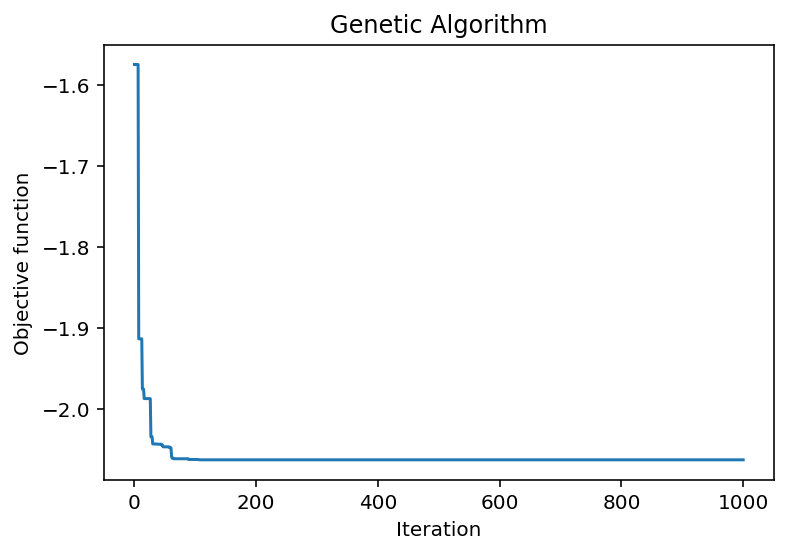

In [ ]:
varbound=np.array([[-5,5]]*2)

model=ga(function=objective,dimension=2,variable_type='real',variable_boundaries=varbound)

model.run()

In [ ]:
# define range for input
r_min, r_max = -2.0, 2.0
xaxis = np.arange(r_min, r_max, 0.01)
yaxis = np.arange(r_min, r_max, 0.01)
# create a mesh from the axis
X = np.meshgrid(xaxis, yaxis)
# compute targets
results = objective(X)

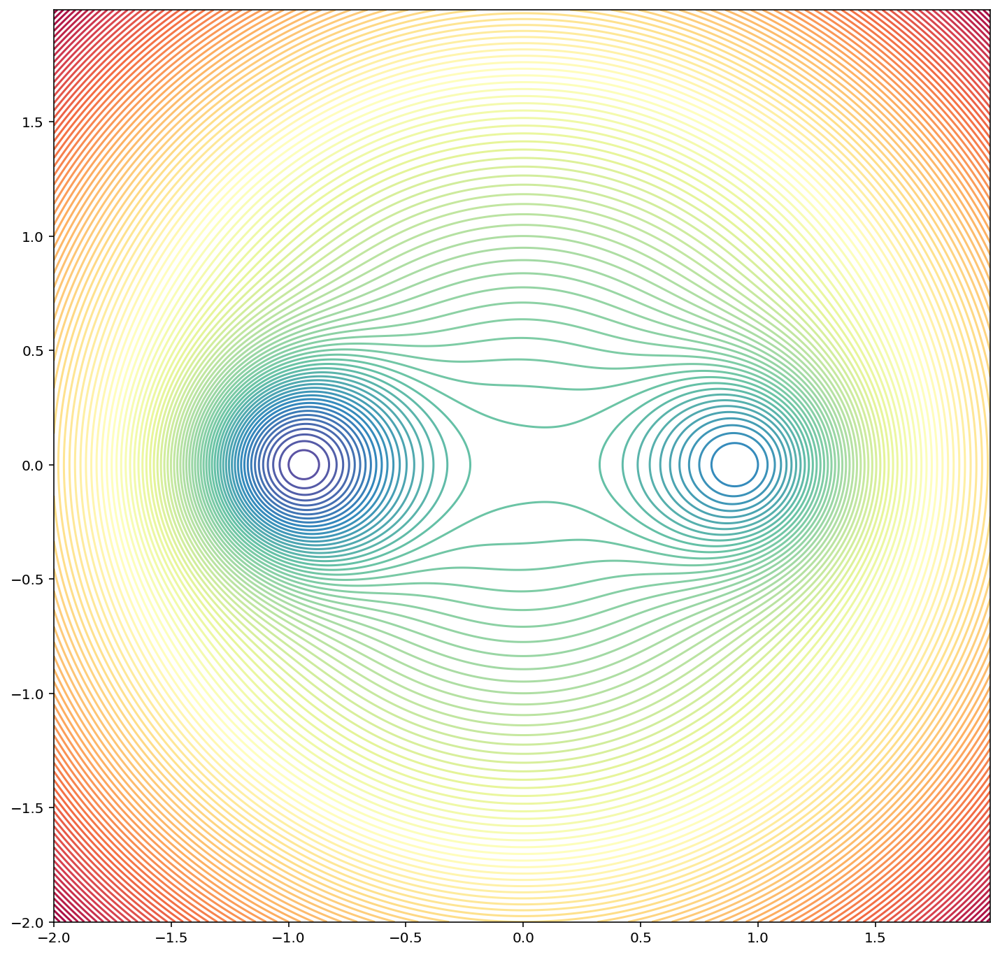

In [ ]:
figure = plt.figure(figsize=(12,12))
plt.contour(X[0],X[1], results, 100, alpha=1.0, cmap='Spectral_r')
plt.show()

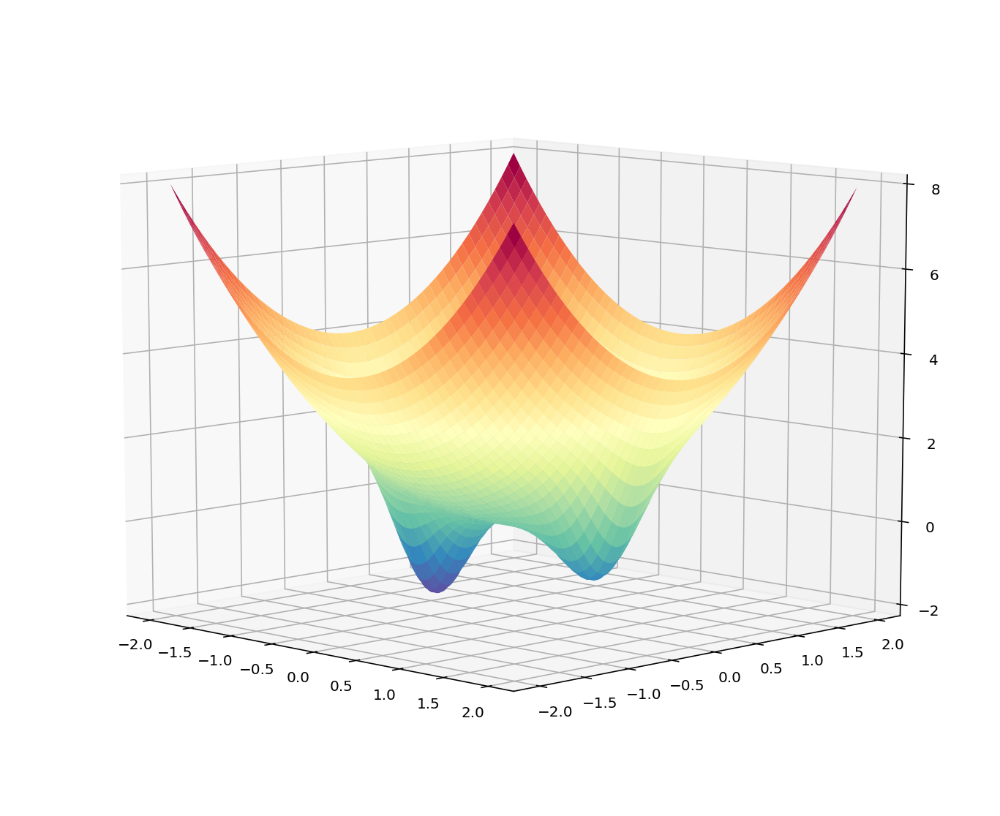

In [ ]:
# create a surface plot with the jet color scheme
figure = plt.figure(figsize=(12,10))
axis = figure.gca(projection='3d')
axis.plot_surface(X[0], X[1], results, cmap='Spectral_r')
axis.view_init(10,-45)
# show the plot
plt.show()

In [ ]:
# Example of interactive 3-D plot
import plotly.graph_objs as go

fig = go.Figure(data=[go.Surface(z=results, x=X[0], y=X[1],colorscale='Jet')])
fig.update_layout(title='Non-Convex Surface', autosize=True,
        scene = {
            "xaxis": {"nticks": 20},
            "zaxis": {"nticks": 4},
            'camera_eye': {"x": 0, "y": -1, "z": 0.5},
            "aspectratio": {"x": 1, "y": 1, "z": 0.75}})
fig.show()

## Example 2 - Multiple equivalent local minima

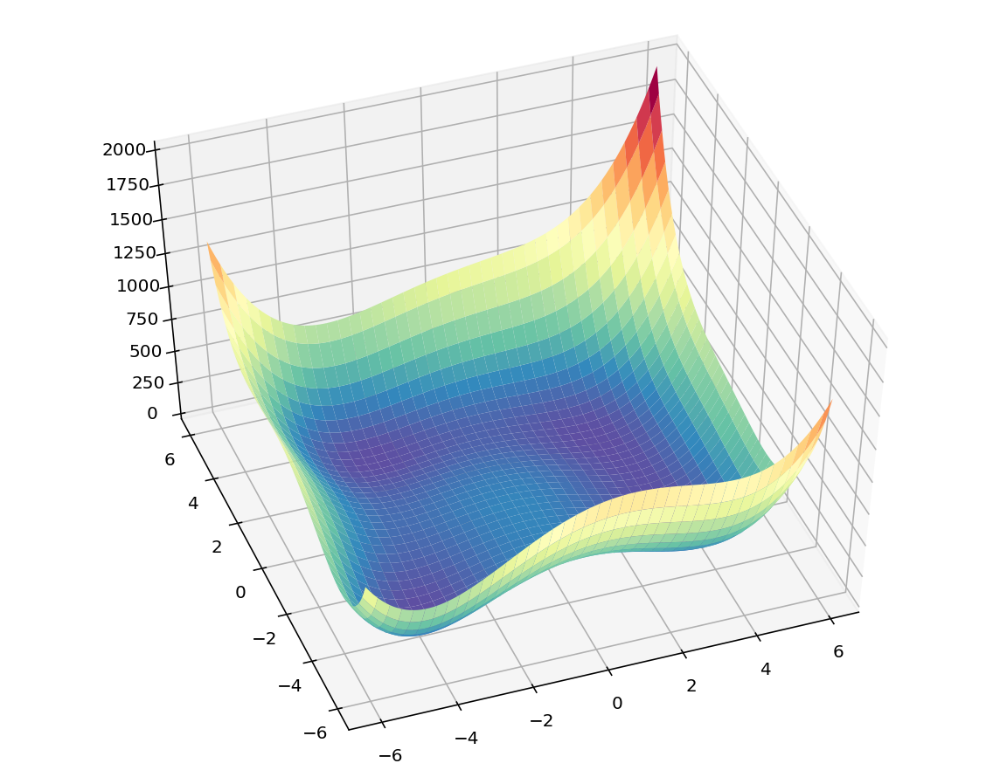

In [ ]:

# multimodal test function (Himmelblau function)

 
# objective function
def objective2(X):
	return (X[0]**2 + X[1] - 11)**2 + (X[0] + X[1]**2 -7)**2
 
# define range for input
r_min, r_max = -6.0, 6.0
# sample input range uniformly at 0.1 increments
xaxis = np.arange(r_min, r_max, 0.1)
yaxis = np.arange(r_min, r_max, 0.1)
# create a mesh from the axis
X = np.meshgrid(xaxis, yaxis)
# compute targets
results = objective2(X)
# create a surface plot with the jet color scheme
figure = plt.figure(figsize=(10,8))
axis = figure.gca(projection='3d')
axis.plot_surface(X[0], X[1], results, cmap='Spectral_r')
axis.view_init(50,250)
# show the plot
plt.show()

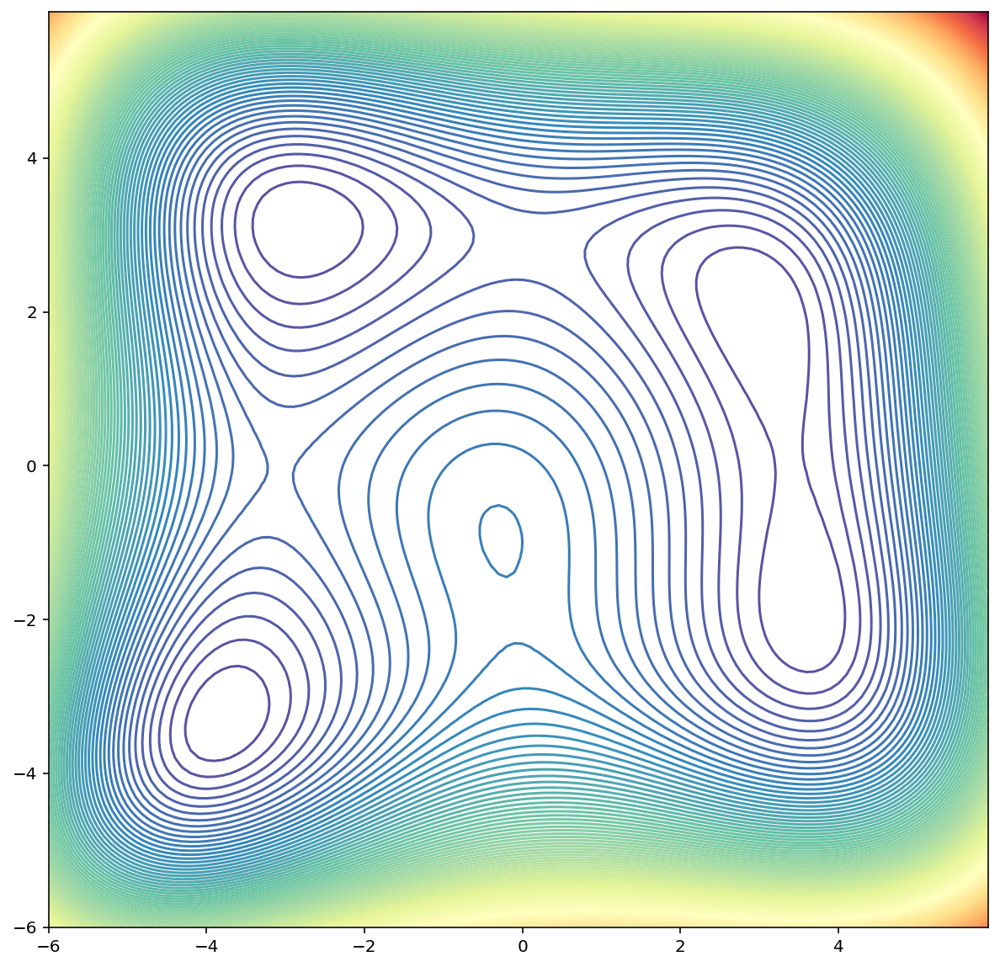

In [ ]:
figure = plt.figure(figsize=(10,10))
plt.contour(X[0], X[1], results, 200, alpha=1.0, cmap='Spectral_r')
plt.show()

##Application of PSO to the second objective function

In [ ]:
import pyswarms as ps

In [ ]:
# instantiate the optimizer
max = np.array([6,6])
min = np.array([-6,-6])
bounds = (min, max)
options = {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
optimizer = ps.single.GlobalBestPSO(n_particles=20, dimensions=2, options=options, bounds=bounds)

In [ ]:
# objective function
def objective1(x):
	return -2*np.exp(-((x[:,0]-1.0)**2+x[:,1]**2)/.2)-3*np.exp(-((x[:,0]+1.0)**2+x[:,1]**2)/.2) + x[:,0]**2+x[:,1]**2

In [ ]:
# objective function with column vectors for the format wanted by the PSO algorithm
def objective2(X):
	return (X[:,0]**2 + X[:,1] - 11)**2 + (X[:,0] + X[:,1]**2 -7)**2

In [ ]:
cost, pos = optimizer.optimize(objective1, iters=100)

2022-03-29 22:56:57,081 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=-1.09
2022-03-29 22:56:57,789 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -1.092731999201741, best pos: [ 9.05317901e-01 -3.90067583e-10]


In [ ]:
pos

array([ 9.05317901e-01, -3.90067583e-10])

In [ ]:
# Initialize mesher with the function
m = Mesher(func=objective2,delta=0.01,limits=[(-6,6),(-6,6)])

In [ ]:
%%capture
# Make animation
animation = plot_contour(pos_history=optimizer.pos_history,mesher=m,mark=(-1,0),designer=Designer(limits=[(-6,6), (-6,6)], label=['x-axis', 'y-axis']))

In [ ]:
HTML(animation.to_html5_video())

2021-11-02 12:57:18,124 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2021-11-02 12:57:18,127 - matplotlib.animation - INFO - MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 720x576 -pix_fmt rgba -r 12.5 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpl4xqa3qf/temp.m4v


## Particle Swarms Optimization (PSO)

In [ ]:
# Import modules
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
from IPython.display import Image
from IPython.display import HTML, display
import pyswarms as ps

In [ ]:
from pyswarms.utils.functions import single_obj as fx
from pyswarms.utils.plotters import (plot_cost_history, plot_contour, plot_surface)
from pyswarms.utils.plotters.formatters import Mesher
from pyswarms.utils.plotters.formatters import Designer

In [ ]:
# objective function
def objective1(X):
	return -2*np.exp(-((X[:,0]-1.0)**2+X[:,1]**2)/.2)-3*np.exp(-((X[:,0]+1.0)**2+X[:,1]**2)/.2) + X[:,0]**2+X[:,1]**2

In [ ]:
# instantiate the optimizer
max = np.array([2,2])
min = np.array([-2,-2])
bounds = (min, max)
options = {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
optimizer = ps.single.GlobalBestPSO(n_particles=20, dimensions=2, options=options, bounds=bounds)

# now run the optimization, pass a=1 and b=100 as a tuple assigned to args

cost, pos = optimizer.optimize(objective1, iters=100)

2021-11-02 12:42:07,032 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=-2.06
2021-11-02 12:42:07,277 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -2.0630902517681946, best pos: [-9.36300635e-01  2.63146792e-09]


In [ ]:
# Initialize mesher with the function
m = Mesher(func=objective1,delta=0.01,limits=[(-2,2),(-2,2)])

In [ ]:
%%capture
# Make animation
animation = plot_contour(pos_history=optimizer.pos_history,mesher=m,mark=(-1,0),designer=Designer(limits=[(-2,2), (-2,2)], label=['x-axis', 'y-axis']))

In [ ]:
HTML(animation.to_html5_video())

2021-11-02 12:43:01,543 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2021-11-02 12:43:01,546 - matplotlib.animation - INFO - MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 720x576 -pix_fmt rgba -r 12.5 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpj4cvfte1/temp.m4v


2021-11-01 21:08:41,147 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.PillowWriter'>


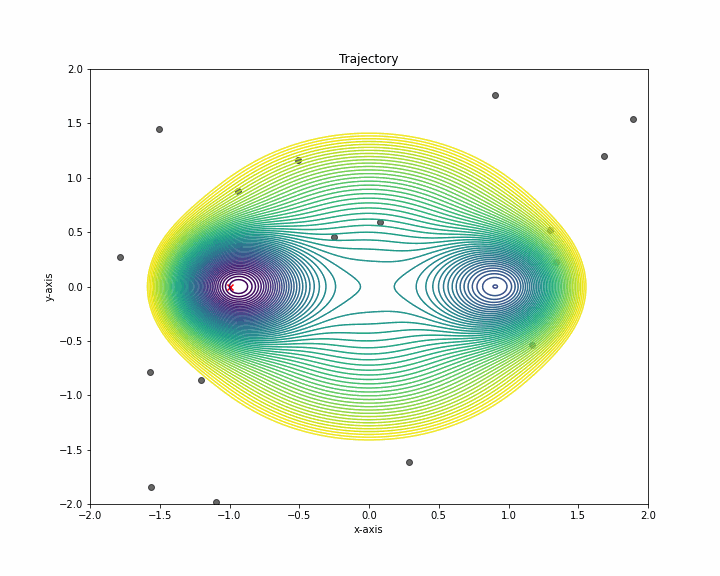

In [ ]:
# Enables us to view it in a Jupyter notebook
animation.save('result2D.gif', writer='pillow', fps=15)
Image(open('result2D.gif','rb').read())